Xử lý bộ dữ liệu Flickr30k

In [9]:
import pandas as pd

# Đọc file captions.txt của Flickr30k
captions_file = r'C:\Users\ADMIN\Downloads\Train model\captions.txt'
captions_data = pd.read_csv(captions_file, names=['image_name', 'comment_number', 'comment'])

# Chuyển đổi cấu trúc dữ liệu để phù hợp với Flickr8k
output_file = r'C:\Users\ADMIN\Downloads\Train model\Flickr30k.token.txt'
with open(output_file, 'w') as f:
    for _, row in captions_data.iterrows():
        f.write(f"{row['image_name']}#{row['comment_number']}\t{row['comment']}\n")

In [3]:
import os
import random

# Đường dẫn thư mục chứa ảnh
images_dir = r'C:\Users\ADMIN\Downloads\Train model\flickr30k_images'
all_images = os.listdir(images_dir)

# Chia dữ liệu train/test (80% train, 20% test)
random.shuffle(all_images)
train_split = int(0.8 * len(all_images))
train_images = all_images[:train_split]
test_images = all_images[train_split:]

# Lưu danh sách ảnh vào file
with open('Flickr30k.trainImages.txt', 'w') as f:
    for img in train_images:
        f.write(img + '\n')

with open('Flickr30k.testImages.txt', 'w') as f:
    for img in test_images:
        f.write(img + '\n')

Gộp file train dataset và test dataset của 2 bộ dữ liệu

In [ ]:
# Đường dẫn tới các file
test_images_1 = r"C:\Users\ADMIN\Downloads\Train model\Flickr_8k.testImages.txt"
test_images_2 = r"C:\Users\ADMIN\Downloads\Train model\Flickr30k.testImages.txt"
output_test_file = r"C:\Users\ADMIN\Downloads\Train model\Test_Images.txt"

train_images_1 = r"C:\Users\ADMIN\Downloads\Train model\Flickr30k.trainImages.txt"
train_images_2 = r"C:\Users\ADMIN\Downloads\Train model\Flickr_8k.trainImages.txt"
output_train_file = r"C:\Users\ADMIN\Downloads\Train model\Train_Images.txt"

def merge_files(file1, file2, output_file):
    with open(output_file, 'w', encoding='utf-8') as outfile:
        # Ghi nội dung từ file1
        with open(file1, 'r', encoding='utf-8') as infile1:
            outfile.write(infile1.read())
        # Ghi nội dung từ file2
        with open(file2, 'r', encoding='utf-8') as infile2:
            outfile.write(infile2.read())

# Gộp các file test
merge_files(test_images_1, test_images_2, output_test_file)

# Gộp các file train
merge_files(train_images_1, train_images_2, output_train_file)

print("Gộp file hoàn tất!")

Gộp file hoàn tất!


Gộp 2 file token

In [10]:
token_1 = r"C:\Users\ADMIN\Downloads\Train model\Flickr8k.token.txt"
token_2 = r"C:\Users\ADMIN\Downloads\Train model\Flickr30k.token.txt"

from charset_normalizer import detect

def detect_file_encoding(file_path):
    with open(file_path, 'rb') as f:
        raw_data = f.read()
    result = detect(raw_data)
    return result['encoding']

# Kiểm tra mã hóa
encoding1 = detect_file_encoding(token_1)
encoding2 = detect_file_encoding(token_2)

print(f"Mã hóa của {token_1}: {encoding1}")
print(f"Mã hóa của {token_2}: {encoding2}")

Mã hóa của C:\Users\ADMIN\Downloads\Train model\Flickr8k.token.txt: utf-8
Mã hóa của C:\Users\ADMIN\Downloads\Train model\Flickr30k.token.txt: ascii


In [11]:
def convert_to_utf8(input_file, output_file, source_encoding):
    with open(input_file, 'r', encoding=source_encoding, errors='replace') as infile, \
         open(output_file, 'w', encoding='utf-8') as outfile:
        outfile.write(infile.read())

# Đường dẫn tới file
token_2 = r"C:\Users\ADMIN\Downloads\Train model\Flickr30k.token.txt"  # windows-1250
converted_token_2 = r"C:\Users\ADMIN\Downloads\Train model\Flickr30k_con.token.txt"  # File UTF-8 mới

# Chuyển đổi từ windows-1250 sang utf-8
convert_to_utf8(token_2, converted_token_2, 'ascii')

print(f"Chuyển đổi {token_2} sang UTF-8 hoàn tất!")

Chuyển đổi C:\Users\ADMIN\Downloads\Train model\Flickr30k.token.txt sang UTF-8 hoàn tất!


In [12]:
output_token_file = r"C:\Users\ADMIN\Downloads\Train model\Images.token.txt"

merge_files(token_1, converted_token_2, output_token_file)

Xử lý dữ liệu của dataset

In [13]:
# Thêm thư viện
import numpy as np
import string
import glob
from pickle import load
from time import time

# Sử dụng tensorflow.keras thay vì keras
from tensorflow.keras.models import Model
from tensorflow.keras.layers import LSTM, Embedding, Dense, Dropout, add, Input
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.sequence import pad_sequences  # Giữ nguyên import này
from tensorflow.keras.utils import to_categorical

In [16]:
# Load the caption file
def load_doc(filename):
    # open the file as read only
    file = open(filename, 'r')
    # read all text
    text = file.read()
    # close the file
    file.close()
    return text

filename = "C:/Users/ADMIN/Downloads/Train model/Images.token.txt"

doc = load_doc(filename)
print(doc[:300])

1000268201_693b08cb0e.jpg#0	A child in a pink dress is climbing up a set of stairs in an entry way .
1000268201_693b08cb0e.jpg#1	A girl going into a wooden building .
1000268201_693b08cb0e.jpg#2	A little girl climbing into a wooden playhouse .
1000268201_693b08cb0e.jpg#3	A little girl climbing the s


In [17]:
# Save captions as key-value pairs: id_image : ['caption 1', 'caption 2', 'caption 3', 'caption 4', 'caption 5']
def load_descriptions(doc):
    mapping = dict()
    # process lines
    for line in doc.split('\n'):
        # split line by white space
        tokens = line.split()
        if len(line) < 2:
            continue
        # take the first token as the image id, the rest as the description
        image_id, image_desc = tokens[0], tokens[1:]
        # extract filename from image id
        image_id = image_id.split('.')[0]
        # convert description tokens back to string
        image_desc = ' '.join(image_desc)
        # create the list if needed
        if image_id not in mapping:
            mapping[image_id] = list()
        # store description
        mapping[image_id].append(image_desc)
    return mapping

descriptions = load_descriptions(doc)
print('Loaded: %d ' % len(descriptions))

Loaded: 39875 


In [18]:
descriptions['1000268201_693b08cb0e']

['A child in a pink dress is climbing up a set of stairs in an entry way .',
 'A girl going into a wooden building .',
 'A little girl climbing into a wooden playhouse .',
 'A little girl climbing the stairs to her playhouse .',
 'A little girl in a pink dress going into a wooden cabin .']

In [19]:
# Preprocessing text
def clean_descriptions(descriptions):
    # prepare translation table for removing punctuation
    table = str.maketrans('', '', string.punctuation)
    for key, desc_list in descriptions.items():
        for i in range(len(desc_list)):
            desc = desc_list[i]
            # tokenize
            desc = desc.split()
            # convert to lower case
            desc = [word.lower() for word in desc]
            # remove punctuation from each token
            desc = [w.translate(table) for w in desc]
            # remove hanging 's' and 'a'
            desc = [word for word in desc if len(word) > 1]
            # remove tokens with numbers in them
            desc = [word for word in desc if word.isalpha()]
            # store as string
            desc_list[i] = ' '.join(desc)

# clean descriptions
clean_descriptions(descriptions)
descriptions['1000268201_693b08cb0e']

['child in pink dress is climbing up set of stairs in an entry way',
 'girl going into wooden building',
 'little girl climbing into wooden playhouse',
 'little girl climbing the stairs to her playhouse',
 'little girl in pink dress going into wooden cabin']

Lưu mô tả

In [20]:
# Save descriptions to file
def save_descriptions(descriptions, filename):
    lines = list()
    for key, desc_list in descriptions.items():
        for desc in desc_list:
            lines.append(key + ' ' + desc)
    data = '\n'.join(lines)
    file = open(filename, 'w')
    file.write(data)
    file.close()

save_descriptions(descriptions, 'descriptions.txt')

In [22]:
# Lấy id ảnh tương ứng với dữ liệu train, test, dev
def load_set(filename):
    doc = load_doc(filename)
    dataset = list()
    # process line by line
    for line in doc.split('\n'):
        # skip empty lines
        if len(line) < 1:
            continue
        # get the image identifier
        identifier = line.split('.')[0]
        dataset.append(identifier)
    return set(dataset)

# load training dataset (6K)
filename = r'C:\Users\ADMIN\Downloads\Train model\Train_Images.txt'
train = load_set(filename)
print('Dataset: %d' % len(train))

Dataset: 31426


In [23]:
# Folder containing images
images = r'C:\Users\ADMIN\Downloads\Train model\Dataset Images/'
# Get all jpg images in the folder
img = glob.glob(images + '*.jpg')

In [24]:
# File containing image IDs for training
train_images_file = r'C:\Users\ADMIN\Downloads\Train model\Train_Images.txt'
# Read the train image names in a set
train_images = set(open(train_images_file, 'r').read().strip().split('\n'))

# Create a list of all the training images with their full path names
train_img = []

for i in img:  # img is list of full path names of all images
    if i[len(images):] in train_images:  # Check if the image belongs to training set
        train_img.append(i)  # Add it to the list of train images

In [25]:
# File containing image IDs for testing
test_images_file = r'C:\Users\ADMIN\Downloads\Train model\Test_Images.txt'
# Read the validation image names in a set# Read the test image names in a set
test_images = set(open(test_images_file, 'r').read().strip().split('\n'))

# Create a list of all the test images with their full path names
test_img = []

for i in img:  # img is list of full path names of all images
    if i[len(images):] in test_images:  # Check if the image belongs to test set
        test_img.append(i)  # Add it to the list of test images

In [26]:
# Thêm 'startseq', 'endseq' cho chuỗi
def load_clean_descriptions(filename, dataset):
    # load document
    doc = load_doc(filename)
    descriptions = dict()
    for line in doc.split('\n'):
        # split line by white space
        tokens = line.split()
        # split id from description
        image_id, image_desc = tokens[0], tokens[1:]
        # skip images not in the set
        if image_id in dataset:
            # create list
            if image_id not in descriptions:
                descriptions[image_id] = list()
            # wrap description in tokens
            desc = 'startseq ' + ' '.join(image_desc) + ' endseq'
            # store
            descriptions[image_id].append(desc)
    return descriptions

# descriptions
train_descriptions = load_clean_descriptions('descriptions.txt', train)
print('Descriptions: train=%d' % len(train_descriptions))

Descriptions: train=31426


In [27]:
# Load ảnh, resize về khích thước mà Inception v3 yêu cầu.
def preprocess(image_path):
    # Convert all the images to size 299x299 as expected by the inception v3 model
    img = image.load_img(image_path, target_size=(299, 299))
    # Convert PIL image to numpy array of 3-dimensions
    x = image.img_to_array(img)
    # Add one more dimension
    x = np.expand_dims(x, axis=0)
    # preprocess the images using preprocess_input() from inception module
    x = preprocess_input(x)
    return x

In [28]:
# Load the inception v3 model
model = InceptionV3(weights='imagenet')
# Create a new model, removing the last layer from inception v3
model_new = Model(model.input, model.layers[-2].output)

In [29]:
# Image embedding thành vector (2048, )
def encode(image):
    image = preprocess(image)  # preprocess the image
    fea_vec = model_new.predict(image)  # Get the encoding vector for the image
    fea_vec = np.reshape(fea_vec, fea_vec.shape[1])  # reshape from (1, 2048) to (2048,)
    return fea_vec

Mã hoá hình ảnh

In [30]:
# Encode training set images
start = time()
encoding_train = {}
for img in train_img:
    encoding_train[img[len(images):]] = encode(img)
print("Time taken in seconds =", time() - start)

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━

Lưu hình ảnh đã mã hoá

In [31]:
import os
from pickle import dump

# Directory to save the pickle file
pickle_dir = "C:/Users/ADMIN/Downloads/Train model/Encode/"

# Check if the directory exists, if not, create it
if not os.path.exists(pickle_dir):
    os.makedirs(pickle_dir)

# Save image embeddings
pickle_file = os.path.join(pickle_dir, "encoded_train_images.pkl")
with open(pickle_file, "wb") as encoded_pickle:
    dump(encoding_train, encoded_pickle)

In [32]:
# Encode test set images
start = time()
encoding_test = {}
for img in test_img:
    encoding_test[img[len(images):]] = encode(img)
print("Time taken in seconds =", time() - start)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━

In [33]:
# Save the bottleneck test features to disk
with open("C:/Users/ADMIN/Downloads/Train model/Encode/encoded_test_images.pkl", "wb") as encoded_pickle:
    dump(encoding_test, encoded_pickle)

Load hình ảnh đã mã hoá

In [34]:
train_features = load(open("C:/Users/ADMIN/Downloads/Train model/Encode/encoded_train_images.pkl", "rb"))
print('Photos: train=%d' % len(train_features))

Photos: train=31426


In [35]:
# Create list of training captions
all_train_captions = []
for key, val in train_descriptions.items():
    for cap in val:
        all_train_captions.append(cap)
print('Total train captions: %d' % len(all_train_captions))

Total train captions: 157130


In [36]:
# Consider only words which occur at least 10 times in the corpus
word_count_threshold = 10
word_counts = {}
nsents = 0
for sent in all_train_captions:
    nsents += 1
    for w in sent.split(' '):
        word_counts[w] = word_counts.get(w, 0) + 1

vocab = [w for w in word_counts if word_counts[w] >= word_count_threshold]
print('Preprocessed words %d -> %d' % (len(word_counts), len(vocab)))

Preprocessed words 18341 -> 5194


Chuyển từ thành index

In [37]:
# Create word to index and index to word mappings
ixtoword = {}
wordtoix = {}
ix = 1
for w in vocab:
    wordtoix[w] = ix
    ixtoword[ix] = w
    ix += 1

vocab_size = len(ixtoword) + 1  # one for appended 0's
print('Vocabulary size:', vocab_size)

Vocabulary size: 5195


In [38]:
import numpy as np

# Save the word-to-index mapping
np.save(r'C:\Users\ADMIN\Downloads\Train model\wordtoix.npy', wordtoix)

# Save the index-to-word mapping
np.save(r'C:\Users\ADMIN\Downloads\Train model\ixtoword.npy', ixtoword)

Load file để mapping

In [39]:
# Tải wordtoix và ixtoword từ các tệp đã có
wordtoix = np.load(r'C:\Users\ADMIN\Downloads\Train model\wordtoix.npy', allow_pickle=True).item()
ixtoword = np.load(r'C:\Users\ADMIN\Downloads\Train model\ixtoword.npy', allow_pickle=True).item()

vocab_size = len(ixtoword) + 1  # one for appended 0's
print('Vocabulary size:', vocab_size)

Vocabulary size: 5195


In [40]:
# Get the maximum length of a description in the dataset
max_length = max(len(d.split()) for d in all_train_captions)
print('Description Length: %d' % max_length)

Description Length: 70


In [41]:
def data_generator(descriptions, photos, wordtoix, max_length, num_photos_per_batch):
    while True:
        X1, X2, y = list(), list(), list()
        n = 0
        for key, desc_list in descriptions.items():
            n += 1
            photo = photos[key + '.jpg']
            for desc in desc_list:
                seq = [wordtoix[word] for word in desc.split(' ') if word in wordtoix]
                for i in range(1, len(seq)):
                    in_seq, out_seq = seq[:i], seq[i]
                    in_seq = pad_sequences([in_seq], maxlen=max_length)[0]
                    out_seq = to_categorical([out_seq], num_classes=vocab_size)[0]
                    X1.append(photo)
                    X2.append(in_seq)
                    y.append(out_seq)
            if n == num_photos_per_batch:
                yield (np.array(X1), np.array(X2)), np.array(y)
                X1, X2, y = list(), list(), list()
                n = 0

In [42]:
glove_dir = r'C:\Users\ADMIN\Downloads\Train model\glove.6B'

embeddings_index = {}

f = open(os.path.join(glove_dir, 'glove.6B.200d.txt'), encoding="utf-8")

for line in f:
    values = line.split()
    word = values[0]
    coefs = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefs
f.close()

print('Found %s word vectors.' % len(embeddings_index))

Found 400001 word vectors.


In [43]:
embeddings_index['the']

array([-7.1549e-02,  9.3459e-02,  2.3738e-02, -9.0339e-02,  5.6123e-02,
        3.2547e-01, -3.9796e-01, -9.2139e-02,  6.1181e-02, -1.8950e-01,
        1.3061e-01,  1.4349e-01,  1.1479e-02,  3.8158e-01,  5.4030e-01,
       -1.4088e-01,  2.4315e-01,  2.3036e-01, -5.5339e-01,  4.8154e-02,
        4.5662e-01,  3.2338e+00,  2.0199e-02,  4.9019e-02, -1.4132e-02,
        7.6017e-02, -1.1527e-01,  2.0060e-01, -7.7657e-02,  2.4328e-01,
        1.6368e-01, -3.4118e-01, -6.6070e-02,  1.0152e-01,  3.8232e-02,
       -1.7668e-01, -8.8153e-01, -3.3895e-01, -3.5481e-02, -5.5095e-01,
       -1.6899e-02, -4.3982e-01,  3.9004e-02,  4.0447e-01, -2.5880e-01,
        6.4594e-01,  2.6641e-01,  2.8009e-01, -2.4625e-02,  6.3302e-01,
       -3.1700e-01,  1.0271e-01,  3.0886e-01,  9.7792e-02, -3.8227e-01,
        8.6552e-02,  4.7075e-02,  2.3511e-01, -3.2127e-01, -2.8538e-01,
        1.6670e-01, -4.9707e-03, -6.2714e-01, -2.4904e-01,  2.9713e-01,
        1.4379e-01, -1.2325e-01, -5.8178e-02, -1.0290e-03, -8.21

In [44]:
embedding_matrix = np.zeros((vocab_size, 200))
for word, i in wordtoix.items():
    if i >= vocab_size:
        continue
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        embedding_matrix[i] = embedding_vector

In [45]:
embedding_matrix.shape

(5195, 200)

In [46]:
embedding_layer = Embedding(vocab_size, 200, weights=[embedding_matrix], input_length=max_length, trainable=False)

inputs1 = Input(shape=(2048,))
fe1 = Dropout(0.5)(inputs1)
fe2 = Dense(256, activation='relu')(fe1)

inputs2 = Input(shape=(max_length,))
se1 = embedding_layer(inputs2)
se2 = LSTM(256)(se1)

decoder1 = add([fe2, se2])
decoder2 = Dense(256, activation='relu')(decoder1)
outputs = Dense(vocab_size, activation='softmax')(decoder2)

model = Model(inputs=[inputs1, inputs2], outputs=outputs)
model.compile(loss='categorical_crossentropy', optimizer='adam')

model.summary()

c:\Users\ADMIN\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 2048)      │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_2       │ (None, 70)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 2048)      │          0 │ input_layer_1[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding           │ (None, 70, 200)   │  1,039,000 │ input_layer_2[0]… │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 256)       │    524,544 │ dropout[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm (LSTM)         │ (None, 256)       │    467,968 │ embedding[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 256)       │          0 │ dense[0][0],      │
│                     │                   │            │ lstm[0][0]        │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 256)       │     65,792 │ add[0][0]         │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 5195)      │  1,335,115 │ dense_1[0][0]     │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 3,432,419 (13.09 MB)

 Trainable params: 2,393,419 (9.13 MB)

 Non-trainable params: 1,039,000 (3.96 MB)

In [47]:
from tensorflow.keras.utils import plot_model

# Vẽ và lưu kiến trúc mô hình dưới dạng ảnh
plot_model(
    model,                           # Thay 'model' bằng tên biến mô hình của bạn
    to_file='model_architecture.png', # Đường dẫn lưu ảnh
    show_shapes=True,                # Hiển thị shape của từng layer
    show_layer_names=True,           # Hiển thị tên của các layer
    dpi=96                           # Độ phân giải của ảnh
)

print("Model architecture saved as 'model_architecture.png'")

Model architecture saved as 'model_architecture.png'


In [48]:
model.optimizer.lr = 0.0001
epochs = 10
number_pics_per_batch = 32
steps = len(train_descriptions) // number_pics_per_batch

In [49]:
for i in range(epochs):
    generator = data_generator(train_descriptions, train_features, wordtoix, max_length, number_pics_per_batch)
    model.fit(generator, epochs=1, steps_per_epoch=steps, verbose=1)

c:\Users\ADMIN\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\models\functional.py:225: UserWarning: The structure of `inputs` doesn't match the expected structure: ['keras_tensor_313', 'keras_tensor_316']. Received: the structure of inputs=('*', '*')
  warnings.warn(


982/982 ━━━━━━━━━━━━━━━━━━━━ 2023s 2s/step - loss: 4.8158
982/982 ━━━━━━━━━━━━━━━━━━━━ 2061s 2s/step - loss: 3.4682
982/982 ━━━━━━━━━━━━━━━━━━━━ 2125s 2s/step - loss: 3.2254
982/982 ━━━━━━━━━━━━━━━━━━━━ 2243s 2s/step - loss: 3.0826
982/982 ━━━━━━━━━━━━━━━━━━━━ 2251s 2s/step - loss: 2.9813
982/982 ━━━━━━━━━━━━━━━━━━━━ 2346s 2s/step - loss: 2.9014
982/982 ━━━━━━━━━━━━━━━━━━━━ 2412s 2s/step - loss: 2.8352
982/982 ━━━━━━━━━━━━━━━━━━━━ 2637s 3s/step - loss: 2.7793
982/982 ━━━━━━━━━━━━━━━━━━━━ 2747s 3s/step - loss: 2.7313
982/982 ━━━━━━━━━━━━━━━━━━━━ 2861s 3s/step - loss: 2.6880


In [50]:
from keras.optimizers import Adam

# Biên dịch lại mô hình
model.compile(optimizer=Adam(learning_rate=0.0001), 
              loss='categorical_crossentropy', 
              metrics=['accuracy'])

In [51]:
# Save the entire model (architecture + weights + optimizer state)
model.save('C:/Users/ADMIN/Downloads/train model/model_new.keras', include_optimizer=True)

In [52]:
images = r'C:\Users\ADMIN\Downloads\Train model\Dataset Images/'

In [53]:
with open(r"C:\Users\ADMIN\Downloads\Train model\Encode\encoded_test_images.pkl", "rb") as encoded_pickle:
    encoding_test = load(encoded_pickle)

In [54]:
# Với môi ảnh mới khi test, ta sẽ bắt đầu chuỗi với 'startseq' rồi sau đó cho vào model để dự đoán từ tiếp theo. Ta thêm từ
# vừa được dự đoán vào chuỗi và tiếp tục cho đến khi gặp 'endseq' là kết thúc hoặc cho đến khi chuỗi dài 34 từ.
def greedySearch(photo):
    in_text = 'startseq'
    for i in range(max_length):
        sequence = [wordtoix[w] for w in in_text.split() if w in wordtoix]
        sequence = pad_sequences([sequence], maxlen=max_length)
        yhat = model.predict([photo,sequence], verbose=0)
        yhat = np.argmax(yhat)
        word = ixtoword[yhat]
        in_text += ' ' + word
        if word == 'endseq':
            break
    final = in_text.split()
    final = final[1:-1]
    final = ' '.join(final)
    return final

Test hình ảnh

c:\Users\ADMIN\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\saving\saving_lib.py:719: UserWarning: Skipping variable loading for optimizer 'adam', because it has 20 variables whereas the saved optimizer has 2 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Processing: C:\Users\ADMIN\Downloads\Train model\Test\Hình 1.jpg


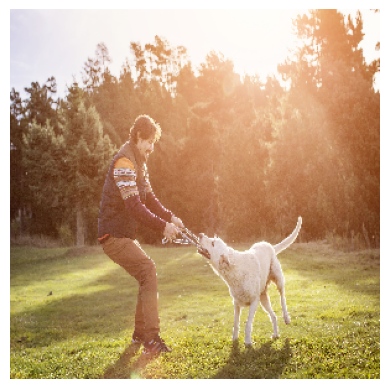

c:\Users\ADMIN\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\models\functional.py:225: UserWarning: The structure of `inputs` doesn't match the expected structure: ['input_layer_1', 'input_layer_2']. Received: the structure of inputs=('*', '*')
  warnings.warn(


Predicted Caption: man in white shirt is standing in the middle of the road
Processing: C:\Users\ADMIN\Downloads\Train model\Test\Hình 10.jpg


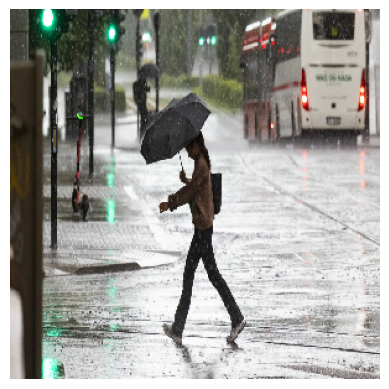

Predicted Caption: woman in black jacket is walking in the rain with her umbrella
Processing: C:\Users\ADMIN\Downloads\Train model\Test\Hình 2.jpg


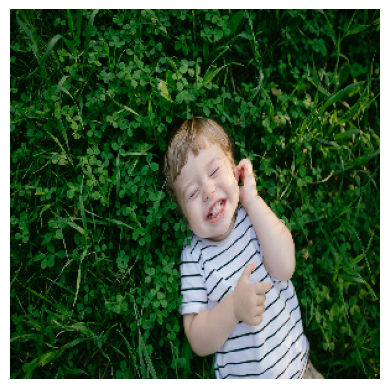

Predicted Caption: young boy in blue shirt is sitting on the grass
Processing: C:\Users\ADMIN\Downloads\Train model\Test\Hình 3.jpg


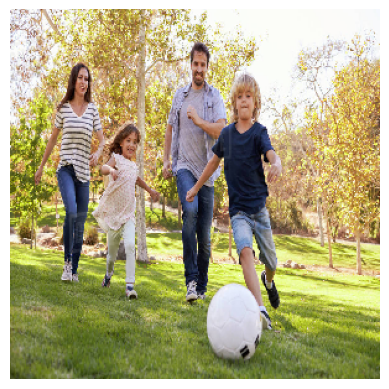

Predicted Caption: man in blue shirt is playing soccer
Processing: C:\Users\ADMIN\Downloads\Train model\Test\Hình 4.jpg


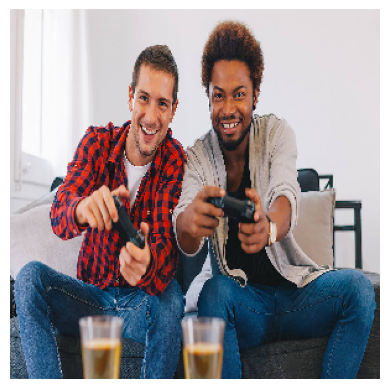

Predicted Caption: man is sitting on the floor with his hand on his lap
Processing: C:\Users\ADMIN\Downloads\Train model\Test\Hình 5.jpg


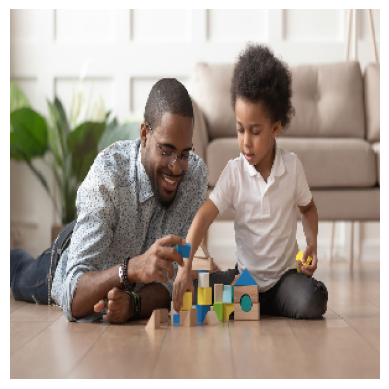

Predicted Caption: man is sitting on the floor playing with toy
Processing: C:\Users\ADMIN\Downloads\Train model\Test\Hình 6.jpg


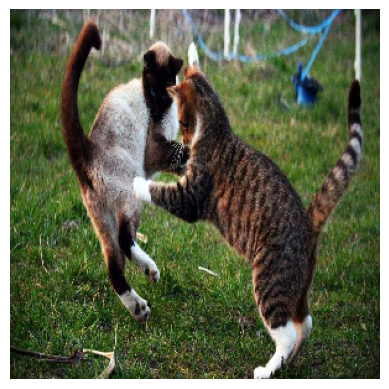

Predicted Caption: dog is jumping over the bar
Processing: C:\Users\ADMIN\Downloads\Train model\Test\Hình 7.jpg


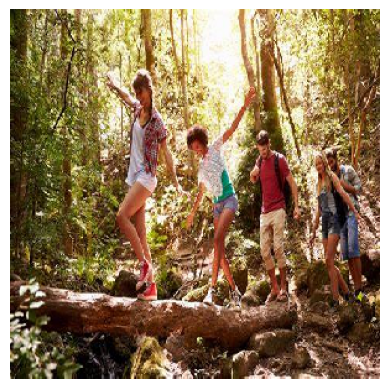

Predicted Caption: man in blue shirt and shorts is standing on rock in the middle of the ocean
Processing: C:\Users\ADMIN\Downloads\Train model\Test\Hình 8.jpg


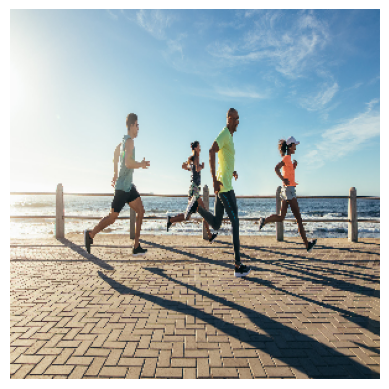

Predicted Caption: two people are standing on beach and one of them is holding hands
Processing: C:\Users\ADMIN\Downloads\Train model\Test\Hình 9.jpg


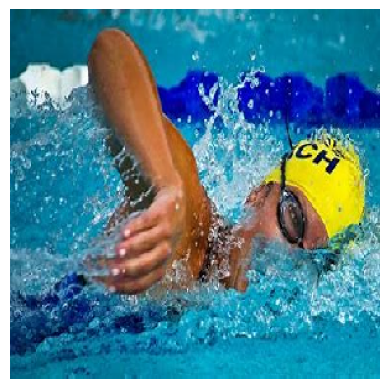

Predicted Caption: boy in swimming pool


In [1]:
import os
import numpy as np
from tensorflow.keras.models import load_model, Model
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt

# Đường dẫn đến các tệp đã lưu
model_path = r'C:\Users\ADMIN\Downloads\Train model\model_new.keras'
encoded_test_images_path = r'C:\Users\ADMIN\Downloads\Train model\Encode\encoded_test_images.pkl'
wordtoix_path = r'C:\Users\ADMIN\Downloads\Train model\wordtoix.npy'
ixtoword_path = r'C:\Users\ADMIN\Downloads\Train model\ixtoword.npy'
test_images_dir = r'C:\Users\ADMIN\Downloads\Train model\Test'

# Tải mô hình đã huấn luyện
model = load_model(model_path)

# Tải các tệp hỗ trợ
wordtoix = np.load(wordtoix_path, allow_pickle=True).item()
ixtoword = np.load(ixtoword_path, allow_pickle=True).item()

# Thiết lập tham số
vocab_size = len(wordtoix) + 1
max_length = 70  # Chiều dài tối đa của câu chú thích

# Tải mô hình InceptionV3 để mã hóa ảnh
inception_model = InceptionV3(weights='imagenet')
model_new = Model(inception_model.input, inception_model.layers[-2].output)

# Hàm tiền xử lý ảnh
def preprocess(image_path):
    img = image.load_img(image_path, target_size=(299, 299))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    return x

# Hàm mã hóa ảnh bằng InceptionV3
def encode_image(image_path):
    img = preprocess(image_path)
    feature_vector = model_new.predict(img, verbose=0)
    feature_vector = feature_vector.reshape((1, feature_vector.shape[1]))
    return feature_vector

# Thuật toán Greedy Search để tạo chú thích
def greedySearch(photo):
    in_text = 'startseq'
    for _ in range(max_length):
        sequence = [wordtoix[w] for w in in_text.split() if w in wordtoix]
        sequence = pad_sequences([sequence], maxlen=max_length)
        yhat = model.predict([photo, sequence], verbose=0)
        yhat = np.argmax(yhat)
        word = ixtoword[yhat]
        in_text += ' ' + word
        if word == 'endseq':
            break
    final = in_text.split()
    final = final[1:-1]
    return ' '.join(final)

# Lấy danh sách ảnh cần test
test_images = [os.path.join(test_images_dir, img) for img in os.listdir(test_images_dir) if img.endswith('.jpg')]

# Hiển thị và dự đoán chú thích cho từng ảnh
for img_path in test_images:
    print(f"Processing: {img_path}")
    
    # Hiển thị ảnh
    img = image.load_img(img_path, target_size=(299, 299))
    plt.imshow(img)
    plt.axis('off')
    plt.show()

    # Mã hóa ảnh và dự đoán chú thích
    encoded_img = encode_image(img_path)
    caption = greedySearch(encoded_img)
    print("Predicted Caption:", caption)

Processing: C:\Users\ADMIN\Downloads\Train model\Test\Hình 4.jpg


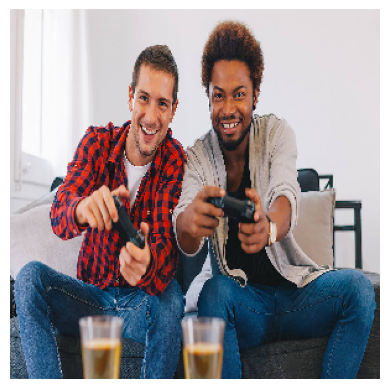

Predicted Caption: man is sitting on the floor with his hand on his lap


In [2]:
# Đường dẫn đến ảnh cần dự đoán
single_image_path = r'C:\Users\ADMIN\Downloads\Train model\Test\Hình 4.jpg'

# Hiển thị ảnh
print(f"Processing: {single_image_path}")
img = image.load_img(single_image_path, target_size=(299, 299))
plt.imshow(img)
plt.axis('off')
plt.show()

# Mã hóa ảnh và dự đoán chú thích
encoded_img = encode_image(single_image_path)
caption = greedySearch(encoded_img)
print("Predicted Caption:", caption)

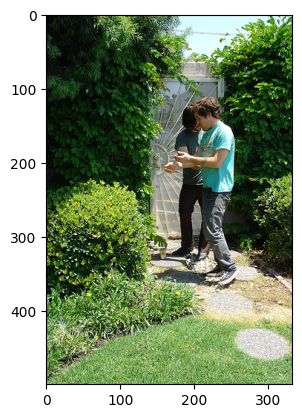

man in white shirt and jeans is standing on the ground next to large tree


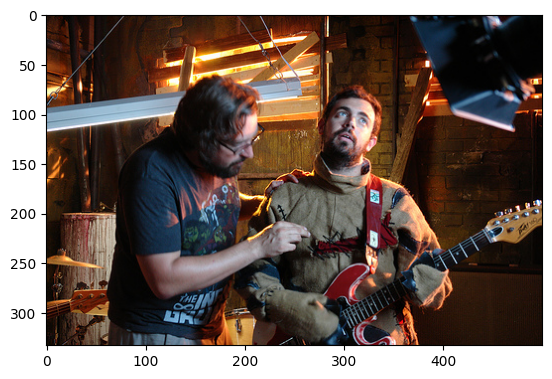

man in black shirt is playing guitar and singing


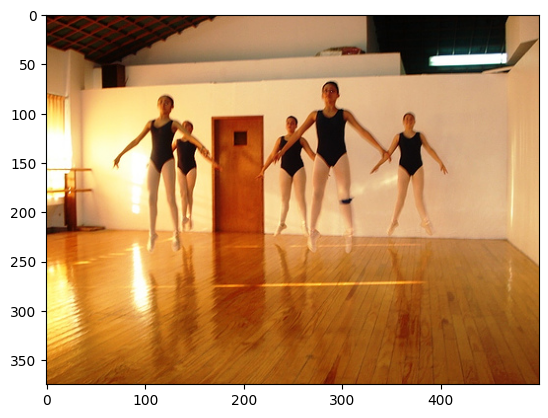

two young girls are dancing in front of building


In [5]:
import matplotlib.pyplot as plt
from pickle import load

with open(r"C:\Users\ADMIN\Downloads\Train model\Encode\encoded_test_images.pkl", "rb") as encoded_pickle:
    encoding_test = load(encoded_pickle)
images = r'C:\Users\ADMIN\Downloads\Train model\Dataset Images/'

z = 0  # bắt đầu từ chỉ số 0, bạn có thể thay đổi giá trị này nếu muốn bắt đầu từ chỉ số khác

# Hiển thị 3 hình ảnh
for i in range(3):
    pic = list(encoding_test.keys())[z + i]  # Lấy từng hình ảnh một trong encoding_test
    image = encoding_test[pic].reshape((1, 2048))  # Đảm bảo dữ liệu hình ảnh được định dạng đúng
    x = plt.imread(images + pic)  # Đọc hình ảnh từ thư mục
    plt.imshow(x)  # Hiển thị hình ảnh
    plt.show()  # Hiển thị hình ảnh
    print(greedySearch(image))  # In ra kết quả tìm kiếm tham lam cho hình ảnh

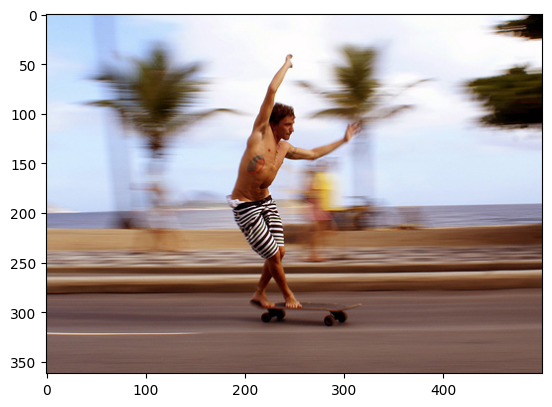

young boy in red shirt is jumping off the ground with his arms in the air


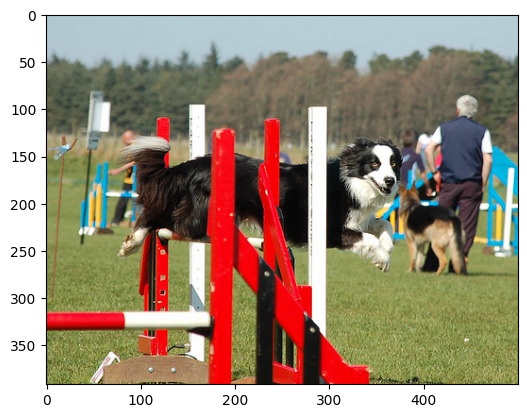

black and white dog is jumping over hurdle


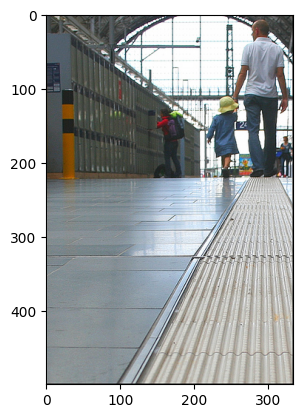

man in black shirt is standing on the sidewalk


In [6]:
import random

z = 0  # bạn có thể điều chỉnh giá trị này nếu muốn bắt đầu từ một chỉ số khác
num_images = 3  # Số lượng hình ảnh ngẫu nhiên cần hiển thị

# Lấy 10 chỉ số ngẫu nhiên từ danh sách các tên ảnh
random_pics = random.sample(list(encoding_test.keys()), num_images)

# Hiển thị 10 hình ảnh ngẫu nhiên
for pic in random_pics:
    image = encoding_test[pic].reshape((1, 2048))  # Đảm bảo dữ liệu hình ảnh được định dạng đúng
    x = plt.imread(images + pic)  # Đọc hình ảnh từ thư mục
    plt.imshow(x)  # Hiển thị hình ảnh
    plt.show()  # Hiển thị hình ảnh
    print(greedySearch(image))  # In ra kết quả tìm kiếm tham lam cho hình ảnh